In [1]:
import kornia
import json
import torch
import kornia.augmentation as K
from kornia.constants import DataKey
from kornia.augmentation.container import AugmentationSequential, ManyToOneAugmentationDispather, VideoSequential
from einops import rearrange
from PIL import Image, ImageDraw
torch.set_printoptions(precision=3, profile='short', sci_mode=False, linewidth=1000)

import numpy as np
from decord import VideoReader
import torchvision.transforms.functional as TF
import torch.nn.functional as F
from IPython.display import Image as IPImage

def tensors_to_pillow(tensors):
    assert tensors.dim() == 4
    images = []
    for tensor in tensors:
        image = TF.to_pil_image(tensor)
        images.append(image)
    return images

def save_pillow_images(images, path='/tmp/test.gif'):
    images[0].save(path, save_all=True, append_images=images[1:], duration=100, loop=0)

def draw_box(image, box, color='red'):
    draw = ImageDraw.Draw(image)
    w, h = image.size
    x1, y1, x2, y2 = box.tolist()
    x1, y1, x2, y2 = int(x1 * w), int(y1 * h), int(x2 * w), int(y2 * h)
    draw.rectangle([x1, y1, x2, y2], outline=color, width=5)
    return image

def draw_rt(images, rt: list[dict], color='red'):
    new_images = []
    for image, box in zip(images, rt):
        new_image = draw_box(image, box, color)
        new_images.append(new_image)
    return new_images

def viz_tensors(tensors):
    p_tmp = '/tmp/img.gif'
    save_pillow_images(tensors_to_pillow(tensors), p_tmp)
    return IPImage(filename=p_tmp)

def viz_rt(tensors, rt: list[dict], color='red'):
    p_tmp = '/tmp/rt.gif'
    save_pillow_images(draw_rt(tensors_to_pillow(tensors), rt, color), p_tmp)
    return IPImage(filename=p_tmp)


def get_sample():
    for ann in json.load(open('/data/gunsbrother/repos/vq2d-lightning/data/vq_v2_train_anno.json')):
        if len(rt:=ann['response_track']) > 9:
            clip_uid = ann['clip_uid']
            ow, oh = ann['original_width'], ann['original_height']
            display(rt)
            print(ann['object_title'])
            print(ow, oh)
            fnos = [res['fno'] for res in rt]
            bboxes = [{'x': res['x']/ow, 'y': res['y']/oh, 'w': res['w']/ow, 'h': res['h']/oh} for res in rt]
            bboxes = torch.tensor([[box['x'], box['y'], box['x'] + box['w'], box['y'] + box['h']] for box in bboxes])
            yield clip_uid, fnos, bboxes

gen = get_sample()


# 랜덤 1개 샘플링

In [223]:
clip_uid, fnos, bboxes = next(gen)
print(clip_uid)
bboxes.shape

[{'fno': 701, 'x': 1237.67, 'y': 303.31, 'w': 42.47, 'h': 121.53},
 {'fno': 702, 'x': 1124.19, 'y': 322.12, 'w': 156.0, 'h': 149.36},
 {'fno': 703, 'x': 1071.73, 'y': 332.94, 'w': 146.34, 'h': 146.63},
 {'fno': 704, 'x': 1078.62, 'y': 341.5, 'w': 149.83, 'h': 150.53},
 {'fno': 705, 'x': 1122.84, 'y': 356.25, 'w': 157.66, 'h': 157.68},
 {'fno': 706, 'x': 1198.5, 'y': 358.5, 'w': 82.0, 'h': 164.88},
 {'fno': 707, 'x': 1208.5, 'y': 315.06, 'w': 71.71, 'h': 167.44},
 {'fno': 708, 'x': 1148.72, 'y': 276.71, 'w': 131.78, 'h': 169.05},
 {'fno': 709, 'x': 1055.45, 'y': 260.08, 'w': 185.61, 'h': 169.21},
 {'fno': 710, 'x': 512.48, 'y': 352.23, 'w': 141.58, 'h': 146.17},
 {'fno': 711, 'x': 468.5, 'y': 407.88, 'w': 134.96, 'h': 149.62},
 {'fno': 712, 'x': 564.61, 'y': 392.34, 'w': 132.09, 'h': 153.16},
 {'fno': 713, 'x': 592.5, 'y': 388.89, 'w': 134.42, 'h': 153.19},
 {'fno': 714, 'x': 600.59, 'y': 391.51, 'w': 135.91, 'h': 156.99},
 {'fno': 715, 'x': 589.93, 'y': 410.39, 'w': 138.7, 'h': 168.81}

bucket shelf
1280 720
4a1a124c-9a58-44bf-85a4-7411ba0c06cc


torch.Size([24, 4])

# 원본 출력

torch.Size([24, 3, 448, 796])


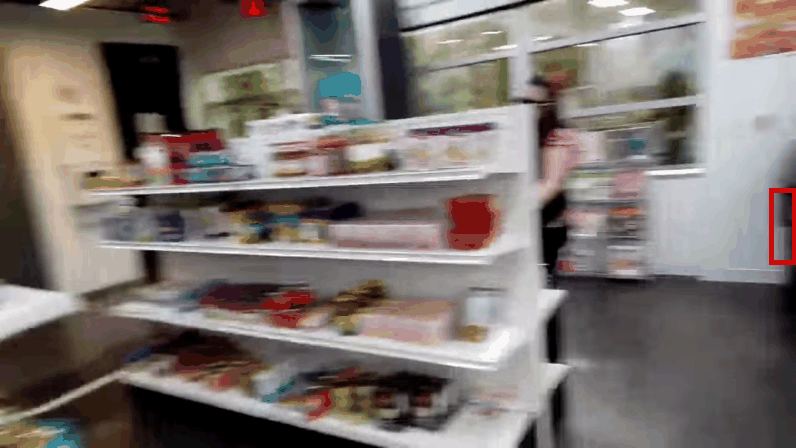

In [224]:
vr = VideoReader(f'/data/datasets/ego4d_data/v2/clips/{clip_uid}.mp4')
frames = vr.get_batch(6*np.array(fnos)).asnumpy()
frames = torch.tensor(frames).permute(0, 3, 1, 2).float() / 255.
_, _, H, W = frames.shape
H, W = 448, int(W/H*448)
frames = F.interpolate(frames, (H, W), mode='bilinear', align_corners=True, antialias=True)
print(frames.shape)

# Example visualization
display(viz_rt(frames, bboxes))

# 1개만 augment

In [225]:
input = torch.randn(2, 3, 5, 6)
mask = torch.ones(2, 3, 5, 6)
aug_list = ManyToOneAugmentationDispather(
    AugmentationSequential(
        kornia.augmentation.ColorJiggle(0.1, 0.1, 0.1, 0.1, p=1.0),
        kornia.augmentation.RandomAffine(360, p=1.0),
        data_keys=["input", "mask",],
    ),
    AugmentationSequential(
        kornia.augmentation.ColorJiggle(0.1, 0.1, 0.1, 0.1, p=1.0),
        kornia.augmentation.RandomAffine(90, p=1.0),
        data_keys=["input", "mask",],
    )
)
output = aug_list(input, mask)
input.shape, output[0][0].shape

(torch.Size([2, 3, 5, 6]), torch.Size([2, 3, 5, 6]))

torch.Size([1, 24, 3, 448, 796])


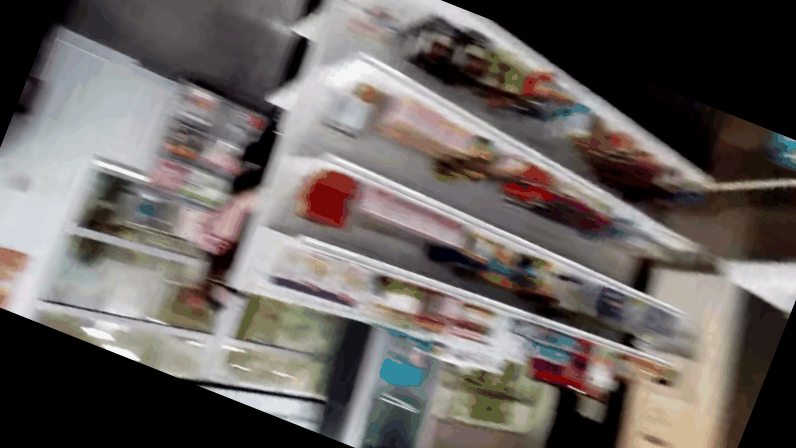

In [226]:
aug_list = VideoSequential(
    kornia.augmentation.ColorJiggle(0.1, 0.1, 0.1, hue=0., p=1.0),
    kornia.augmentation.RandomAffine(360, p=1.0),
    # random_apply=10,
    data_format="BTCHW",
    same_on_frame=True
)

output = aug_list(frames[None])
print(output.shape)
viz_tensors(output[0])

# 프레임마다 다른 aug를 하면? 

torch.Size([1, 24, 3, 224, 224])


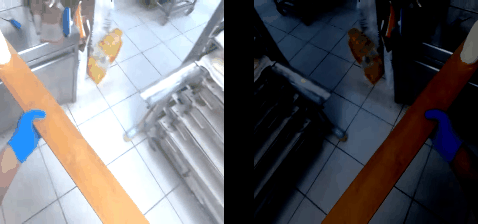

In [168]:
args = (
    kornia.augmentation.ColorJiggle(brightness=0.4, contrast=0.4, saturation=0.3, hue=0, p=1.0),
    kornia.augmentation.RandomHorizontalFlip(p=0.5),
    kornia.augmentation.RandomResizedCrop(
        (224, 224),  # resize size after crop
        scale=(0.66, 1.0),  # crop size as a ratio of the input image
        ratio=(.8, 1.2),  # aspect ratio range
        p=1.0),  # h, w
)
aug_list1 = VideoSequential(*args, data_format="BTCHW", same_on_frame=False)
aug_list2 = VideoSequential(*args, data_format="BTCHW", same_on_frame=True)

output = aug_list1(frames[None])
output2 = aug_list2(frames[None])

print(output.shape)
combined = torch.cat([output[0], torch.zeros(*output.shape[1:-1], 30), output2[0]], dim=-1)
viz_tensors(combined)

# 비디오 + bbox augment

In [227]:
from einops import rearrange
rearrange(bboxes, 't c -> () t () c').shape  # batch, time, boxes, xyxy

torch.Size([1, 24, 1, 4])

torch.Size([1, 24, 3, 448, 448])
torch.Size([1, 24, 4])


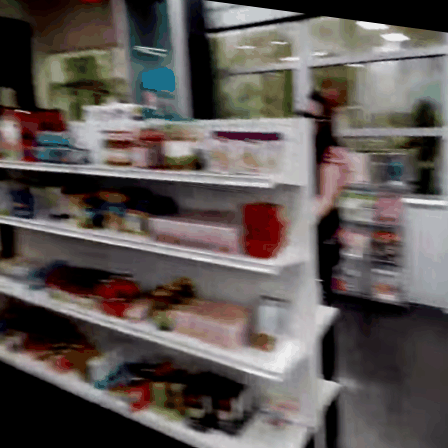

In [229]:
aug_list = AugmentationSequential(
    VideoSequential(
        kornia.augmentation.ColorJiggle(0.3, 0.4, 0.3, hue=0., p=1.0),
        kornia.augmentation.RandomAffine(10, translate=None, scale=None, shear=(-10, 10, -10, 10), align_corners=True, padding_mode=0, p=1.0),
        kornia.augmentation.RandomResizedCrop((448, 448), scale=(0.66, 1.0), ratio=(.8, 1.2), p=1.0),  # h, w
        data_format="BTCHW", same_on_frame=True
    ),
    data_keys=[DataKey.INPUT, DataKey.BBOX_XYXY],
)

bboxes_ = rearrange(bboxes * torch.tensor([W, H, W, H]), 't c -> () t () c')
bboxes_ = bboxes_[..., [[0, 1], [2, 1], [2, 3], [0, 3]]]  # xyxy -> xy xy xy xy, clockwise, [b,t,n,4,2]
output = aug_list(frames[None], bboxes_)
bboxes_ = output[1].squeeze(2) / 448  # [b,t,4]
print(output[0].shape)
print(bboxes_.shape)
# print(aug_list._params[0].data[0].data)
viz_rt(output[0][0], bboxes_[0])

In [171]:
bboxes_

tensor([[[ 0.344, -0.039,  0.447,  0.069],
         [ 0.455,  0.023,  0.567,  0.129],
         [ 0.552,  0.091,  0.670,  0.199],
         [ 0.652,  0.158,  0.777,  0.285],
         [ 0.726,  0.199,  0.860,  0.329],
         [ 0.774,  0.209,  0.915,  0.342],
         [ 0.793,  0.203,  0.937,  0.335],
         [ 0.815,  0.171,  0.962,  0.298],
         [ 0.859,  0.152,  1.014,  0.283],
         [ 0.910,  0.160,  1.069,  0.294],
         [ 0.978,  0.208,  1.140,  0.325],
         [ 1.026,  0.234,  1.208,  0.355],
         [ 1.056,  0.227,  1.239,  0.357],
         [ 1.060,  0.230,  1.239,  0.359],
         [ 1.044,  0.223,  1.212,  0.347],
         [ 1.012,  0.194,  1.196,  0.308],
         [ 1.001,  0.170,  1.186,  0.294],
         [ 0.987,  0.173,  1.170,  0.292],
         [ 0.947,  0.187,  1.105,  0.294],
         [ 0.866,  0.173,  1.001,  0.277],
         [ 0.792,  0.174,  0.929,  0.289],
         [ 0.733,  0.179,  0.862,  0.281],
         [ 0.606,  0.200,  0.724,  0.295],
         [ 